In [1]:
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

%matplotlib inline
from distfit import distfit
from scipy.stats import norm,dweibull
from keras.models import load_model
import pandas as pd
import numpy as np
from keras.layers import Dense,Conv1D,Convolution1D,Activation,MaxPooling1D,Flatten,Dropout

from keras.callbacks import TensorBoard
from keras import regularizers

import seaborn as sns
import scanpy as sc
import scglue
import scvelo as scv

In [2]:
#卷积神经网络
def creat_radio_model(input_dim):
    
    model=Sequential(name='radio_model')

    model.add(Dense(512,input_dim = input_dim,activation="relu"))
    model.add(Dense(512,activation="relu"))
    model.add(Dense(512,activation="relu"))
    model.add(Dense(1,activation = "linear"))

    model.compile(optimizer='adam',loss="mean_squared_error",metrics=["mean_absolute_error"])

    print(model.summary())
    return model


In [45]:
import anndata
adata6=anndata.read_h5ad('scvelo-pancreas.h5ad')
adata2=anndata.read_h5ad('tsp1_bladder_mesenchymeToMyofibroblast_forPaper.h5ad')
adata1=anndata.read_h5ad('tsp2_bladder_mesenchymeToMyofibroblast_forPaper.h5ad')

In [56]:
import scLTNN
scpancera=scLTNN.scLTNN(adata6)
scpancera.load_model('my_model1.h5')
#scpancera.cal_high_variable_genes()
scpancera.cal_lsi(n_components=100)
scpancera.cal_paga(resolution=1.0)
scpancera.cal_model_time()
scpancera.cal_rps_value(species='mouse')
scpancera.cal_dpt_pseudotime(leiden_range=0.01)
scpancera.CNN(batch_size=30,epochs=10,verbose=0)
scpancera.cal_distrubute()
scpancera.cal_scLTNN_time()

......calculate lsi
......calculate paga
......predict model_time


2022-07-04 18:51:54.086208: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......calculate RPS value
......calculate dpt_pseudotime
......leiden_start ['3'] leiden_end ['5']
......CNN
Model: "scLTNN_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 512)               51712     
                                                                 
 dense_9 (Dense)             (None, 512)               262656    
                                                                 
 dense_10 (Dense)            (None, 512)               262656    
                                                                 
 dense_11 (Dense)            (None, 1)                 513       
                                                                 
Total params: 577,537
Trainable params: 577,537
Non-trainable params: 0
_________________________________________________________________
None


2022-07-04 18:51:54.956090: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-04 18:51:55.277781: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......CNN:loss 0.0172176081687212 MAE 0.100747250020504
......predicted CNN Time


2022-07-04 18:51:56.893994: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......Dweibull analysis
[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 103.185] [loc=0.536 scale=0.357]
[distfit] >[expon     ] [0.00 sec] [RSS: 96.1483] [loc=0.000 scale=0.536]
[distfit] >[pareto    ] [0.06 sec] [RSS: 94.7242] [loc=-233968759.779 scale=233968759.779]
[distfit] >[dweibull  ] [0.01 sec] [RSS: 71.7422] [loc=0.455 scale=0.380]
[distfit] >[t         ] [0.04 sec] [RSS: 103.185] [loc=0.536 scale=0.357]
[distfit] >[genextreme] [0.05 sec] [RSS: 86.9022] [loc=0.501 scale=0.399]
[distfit] >[gamma     ] [0.04 sec] [RSS: 103.619] [loc=-4.987 scale=0.024]
[distfit] >[lognorm   ] [0.08 sec] [RSS: 103.263] [loc=-75.228 scale=75.764]
[distfit] >[beta      ] [0.05 sec] [RSS: 86.3836] [loc=-0.093 scale=1.093]
[distfit] >[uniform   ] [0.00 sec] [RSS: 86.4552] [loc=0.000 scale=1.000]
[distfit] >[loggamma  ] [0.01 sec] [RSS: 74.9068] [loc=0.949 scale=0.020]
[distfit] >Compute confidence interval [parametric]
......Norm analysis
[distfit] >fit..
[distfit] >

In [48]:
help(sc.settings.set_figure_params)

Help on method set_figure_params in module scanpy._settings:

set_figure_params(scanpy: bool = True, dpi: int = 80, dpi_save: int = 150, frameon: bool = True, vector_friendly: bool = True, fontsize: int = 14, figsize: Union[int, NoneType] = None, color_map: Union[str, NoneType] = None, format: Literal['png', 'jpg', 'tif', 'tiff', 'pdf', 'ps', 'eps', 'svg', 'svgz', 'pgf', 'raw', 'rgba'] = 'pdf', facecolor: Union[str, NoneType] = None, transparent: bool = False, ipython_format: str = 'png2x') method of scanpy._settings.ScanpyConfig instance
    Set resolution/size, styling and format of figures.
    
    Parameters
    ----------
    scanpy
        Init default values for :obj:`matplotlib.rcParams` suited for Scanpy.
    dpi
        Resolution of rendered figures – this influences the size of figures in notebooks.
    dpi_save
        Resolution of saved figures. This should typically be higher to achieve
        publication quality.
    frameon
        Add frames and axes labels to scat

In [49]:
sc.settings.set_figure_params(dpi=80, facecolor='white',dpi_save=300)

In [24]:
scpancera.dist1.summary

,distr,score,LLE,loc,scale,arg
0,dweibull,71.742217,NaN,0.454878,0.379726,"(3.2488087684927214,)"
1,loggamma,74.906755,NaN,0.948645,0.01974,"(0.049016776344534316,)"
2,beta,86.383578,NaN,-0.092618,1.092618,"(1.1116654413896048, 0.8667031402299022)"
3,uniform,86.455215,NaN,0.0,1.0,()
4,genextreme,86.902215,NaN,0.50119,0.398954,"(0.7997108463302871,)"
5,pareto,94.724228,NaN,-233968759.778701,233968759.778701,"(373395323.9957124,)"
6,expon,96.14835,NaN,0.0,0.536067,()
7,t,103.184626,NaN,0.536078,0.3569,"(9019952.639772499,)"
8,norm,103.184635,NaN,0.536067,0.356903,()
9,lognorm,103.262999,NaN,-75.228422,75.763756,"(0.004712030645575269,)"


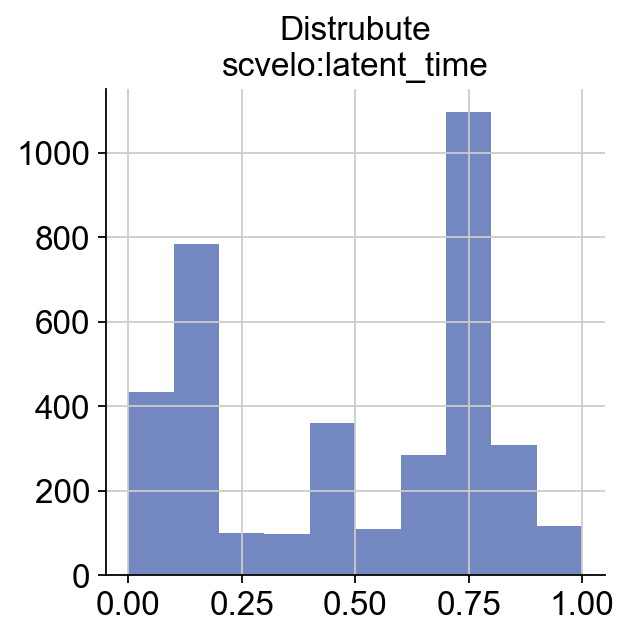

In [47]:
import matplotlib.pyplot as plt

#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

plt.hist(scpancera.adata_test.obs['latent_time'],color='#7388c1')

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

plt.title('Distrubute\nscvelo:latent_time',fontsize=15)
plt.savefig("figure/Fig4_dis_latent_time.png",dpi=300,bbox_inches = 'tight')

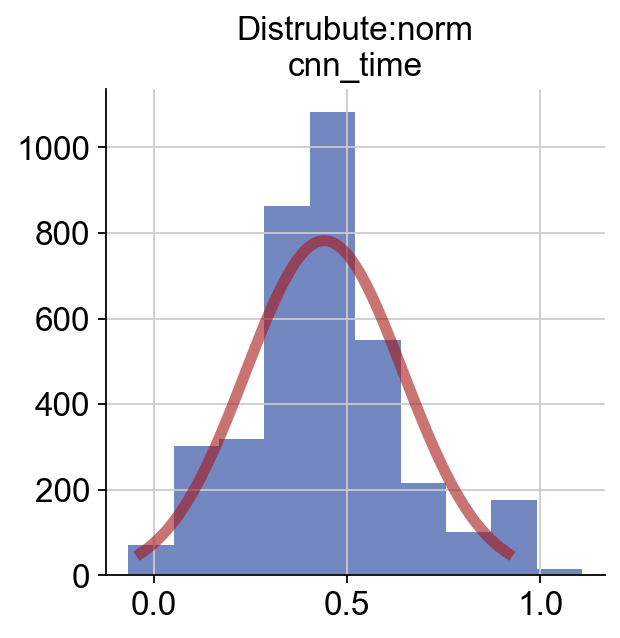

In [46]:
import matplotlib.pyplot as plt

#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

plt.hist(scpancera.adata_test.obs['p_cnn_time'],color='#7388c1')
from scipy.stats import norm
import numpy as np
x = np.linspace(norm.ppf(0.01,loc=0.441,scale=0.204),
                 norm.ppf(0.99,loc=0.441,scale=0.204), 100)
plt.plot(x, norm.pdf(x, loc=0.441,scale=0.204)*400,
        'r-', lw=5, alpha=0.6, label='norm pdf',color='#a51616')

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

plt.title('Distrubute:norm\ncnn_time',fontsize=15)
plt.savefig("figure/Fig4_dis_cnn_time.png",dpi=300,bbox_inches = 'tight')

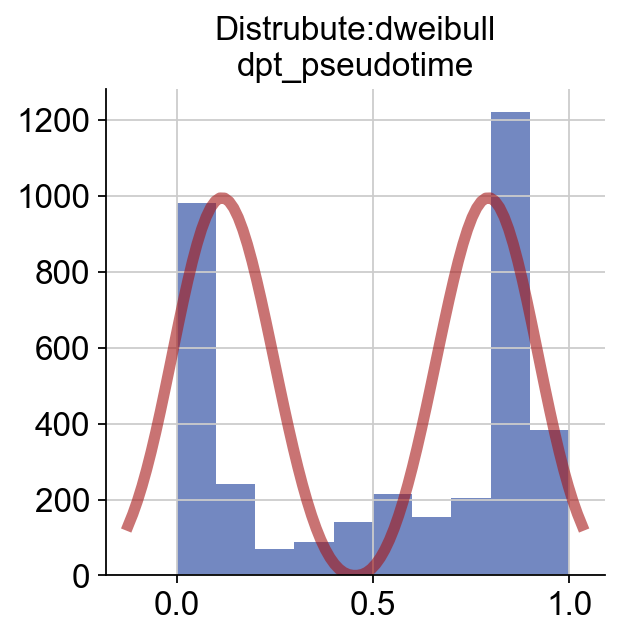

In [44]:
import matplotlib.pyplot as plt

#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

plt.hist(scpancera.adata_test.obs['dpt_pseudotime'],color='#7388c1')
from scipy.stats import dweibull
import numpy as np
x = np.linspace(dweibull.ppf(0.01,*scpancera.dist1.model['params']),
                 dweibull.ppf(0.99,*scpancera.dist1.model['params']), 100)
plt.plot(x, dweibull.pdf(x, *scpancera.dist1.model['params'])*600,
        'r-', lw=5, alpha=0.6, label='dweibull pdf',color='#a51616')

#设置横纵坐标轴字体,
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

plt.title('Distrubute:dweibull\ndpt_pseudotime',fontsize=15)
plt.savefig("figure/Fig4_dis_dpt_time.png",dpi=300,bbox_inches = 'tight')

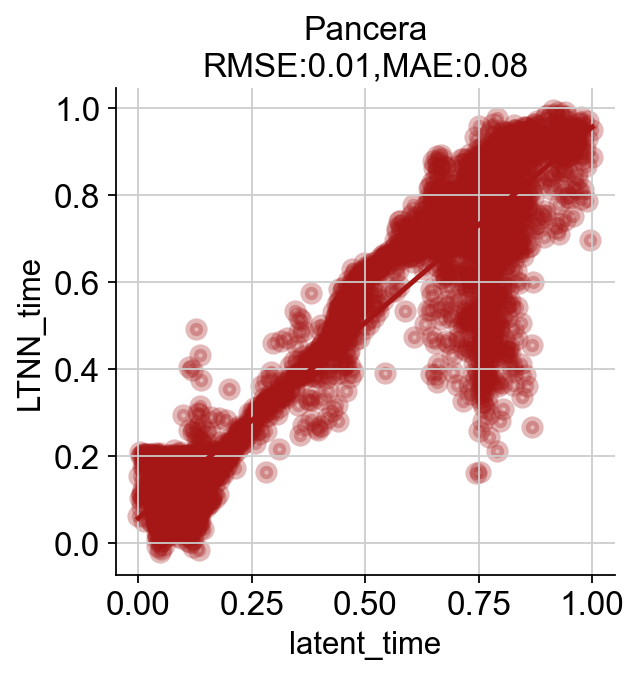

In [73]:

from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

sns.regplot(x=scpancera.adata_test.obs['latent_time'], y=scpancera.adata_test.obs['LTNN_time'],
    scatter_kws={'alpha':0.3,'linewidths':4},color='#a51616',ax=ax)

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

mae=round(mean_absolute_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['LTNN_time']),2)
mse=round(mean_squared_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['LTNN_time']),2)
#r2_score=round(r2_score(Y_val, PredValSet.T[0]),2)

plt.title('Pancera\nRMSE:{},MAE:{}'.format(mse,mae),fontsize=15)
plt.savefig("figure/Fig4_pancera_ltnn_latent.png",dpi=300,bbox_inches = 'tight')

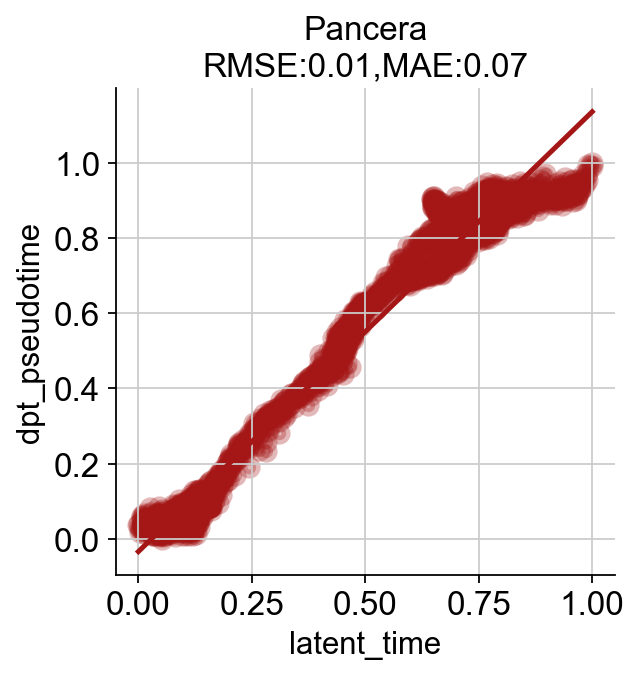

In [72]:

from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

sns.regplot(x=scpancera.adata_test.obs['latent_time'], y=scpancera.adata_test.obs['dpt_pseudotime'],
    scatter_kws={'alpha':0.3,'linewidths':4},color='#a51616',ax=ax)

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

mae=round(mean_absolute_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['dpt_pseudotime']),2)
mse=round(mean_squared_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['dpt_pseudotime']),2)
#r2_score=round(r2_score(Y_val, PredValSet.T[0]),2)

plt.title('Pancera\nRMSE:{},MAE:{}'.format(mse,mae),fontsize=15)
plt.savefig("figure/Fig4_pancera_dpt_latent.png",dpi=300,bbox_inches = 'tight')

In [51]:
sc.settings.set_figure_params(dpi=300, facecolor='white',dpi_save=300)

saving figure to file ./figures/scvelo__fig4_pancera_time.png


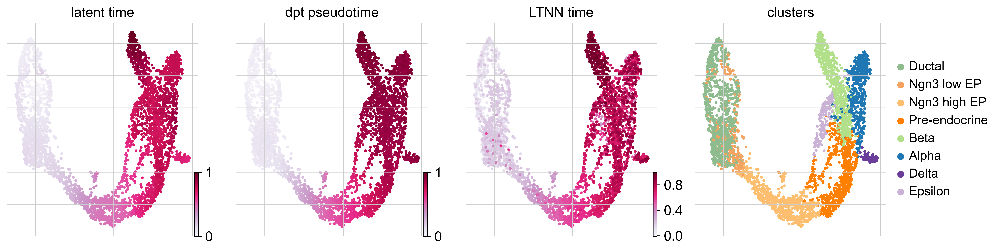

In [52]:
scv.pl.scatter(scpancera.adata_test, color=['latent_time','dpt_pseudotime','LTNN_time','clusters'], 
               cmap='PuRd',legend_loc='right margin',save='_fig4_pancera_time.png')

saving figure to file ./figures/scvelo__sfig4_pancera_time.png


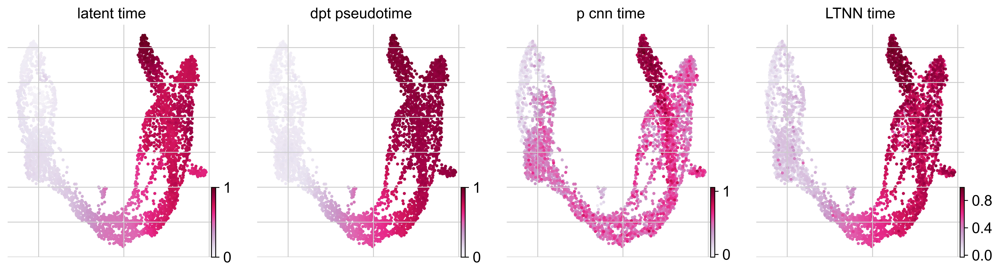

In [57]:
scv.pl.scatter(scpancera.adata_test, color=['latent_time','dpt_pseudotime','p_cnn_time','LTNN_time'], 
               cmap='PuRd',legend_loc='right margin',save='_sfig4_pancera_time.png')

In [53]:
import scLTNN
scpancera=scLTNN.scLTNN(adata2)
scpancera.load_model('my_model1.h5')
#scpancera.cal_high_variable_genes()
scpancera.cal_lsi(n_components=100)
scpancera.cal_paga(resolution=1.0)
scpancera.cal_model_time()
scpancera.cal_rps_value(species='human')
scpancera.cal_dpt_pseudotime(leiden_range=0.03)
scpancera.CNN(batch_size=30,epochs=10,verbose=0)
scpancera.cal_distrubute()
scpancera.cal_scLTNN_time()

......calculate lsi
......calculate paga
......predict model_time


2022-07-04 18:41:01.896690: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......calculate RPS value
......calculate dpt_pseudotime
......leiden_start ['0', '5'] leiden_end ['4']
......CNN
Model: "scLTNN_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 512)               51712     
                                                                 
 dense_5 (Dense)             (None, 512)               262656    
                                                                 
 dense_6 (Dense)             (None, 512)               262656    
                                                                 
 dense_7 (Dense)             (None, 1)                 513       
                                                                 
Total params: 577,537
Trainable params: 577,537
Non-trainable params: 0
_________________________________________________________________
None


2022-07-04 18:41:02.509992: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-04 18:41:02.938608: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......CNN:loss 0.014048393815755844 MAE 0.08727937936782837
......predicted CNN Time


2022-07-04 18:41:05.857148: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......Dweibull analysis
[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 170.556] [loc=0.141 scale=0.134]
[distfit] >[expon     ] [0.00 sec] [RSS: 128.806] [loc=0.000 scale=0.141]
[distfit] >[pareto    ] [0.06 sec] [RSS: 128.625] [loc=-25656275.132 scale=25656275.132]
[distfit] >[dweibull  ] [0.01 sec] [RSS: 151.385] [loc=0.111 scale=0.100]
[distfit] >[t         ] [0.02 sec] [RSS: 46.1905] [loc=0.064 scale=0.029]
[distfit] >[genextreme] [0.05 sec] [RSS: 41.4572] [loc=0.069 scale=0.049]
[distfit] >[gamma     ] [0.01 sec] [RSS: 102.441] [loc=-0.000 scale=0.095]
[distfit] >[lognorm   ] [0.05 sec] [RSS: 65.0454] [loc=-0.001 scale=0.099]
[distfit] >[beta      ] [0.07 sec] [RSS: 101.568] [loc=-0.000 scale=2075640530072.534]
[distfit] >[uniform   ] [0.00 sec] [RSS: 244.187] [loc=0.000 scale=1.000]
[distfit] >[loggamma  ] [0.03 sec] [RSS: 170.717] [loc=-42.156 scale=5.668]
[distfit] >Compute confidence interval [parametric]
......Norm analysis
[distfit] >fit..
[

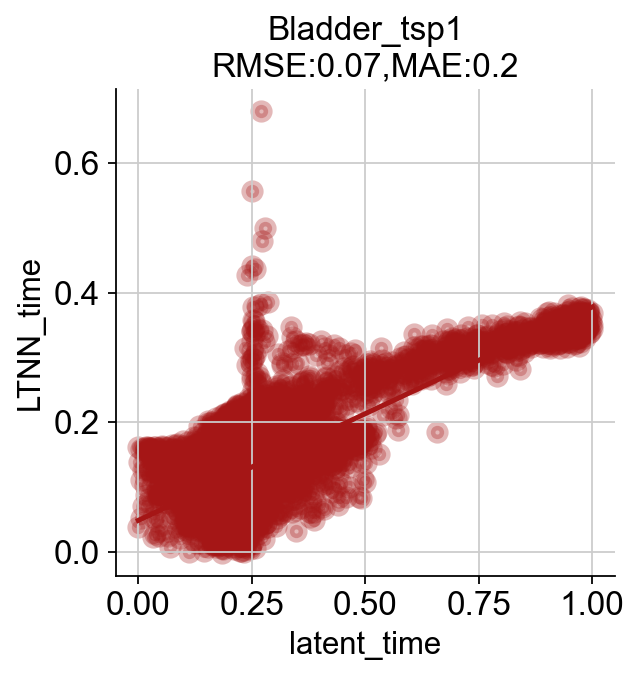

In [60]:

from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

sns.regplot(x=scpancera.adata_test.obs['latent_time'], y=scpancera.adata_test.obs['LTNN_time'],
    scatter_kws={'alpha':0.3,'linewidths':4},color='#a51616',ax=ax)

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

mae=round(mean_absolute_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['LTNN_time']),2)
mse=round(mean_squared_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['LTNN_time']),2)
#r2_score=round(r2_score(Y_val, PredValSet.T[0]),2)

plt.title('Bladder_tsp1\nRMSE:{},MAE:{}'.format(mse,mae),fontsize=15)
plt.savefig("figure/Fig4_tsp1_ltnn_latent.png",dpi=300,bbox_inches = 'tight')

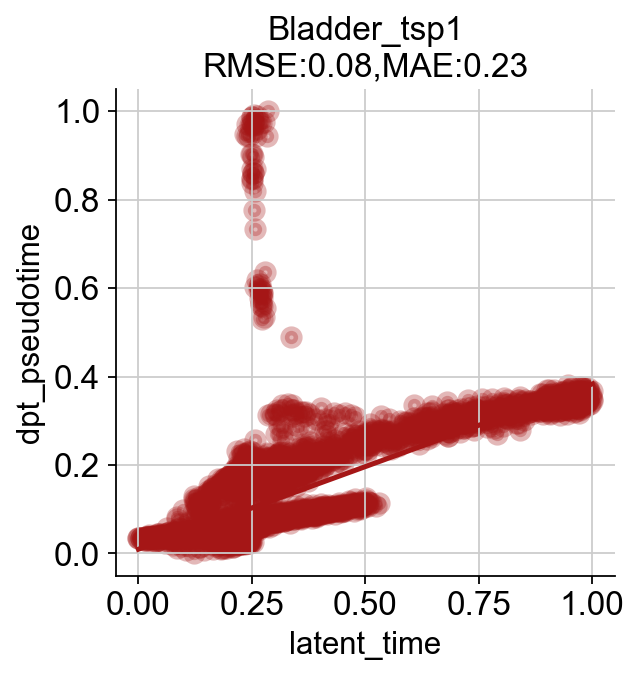

In [61]:

from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

sns.regplot(x=scpancera.adata_test.obs['latent_time'], y=scpancera.adata_test.obs['dpt_pseudotime'],
    scatter_kws={'alpha':0.3,'linewidths':4},color='#a51616',ax=ax)

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

mae=round(mean_absolute_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['dpt_pseudotime']),2)
mse=round(mean_squared_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['dpt_pseudotime']),2)
#r2_score=round(r2_score(Y_val, PredValSet.T[0]),2)

plt.title('Bladder_tsp1\nRMSE:{},MAE:{}'.format(mse,mae),fontsize=15)
plt.savefig("figure/Fig4_tsp1_dpt_latent.png",dpi=300,bbox_inches = 'tight')

In [62]:
scpancera.adata_test

AnnData object with n_obs × n_vars = 3965 × 2000
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_method', 'decontX_c

saving figure to file ./figures/scvelo__fig4_tsp1_time.png


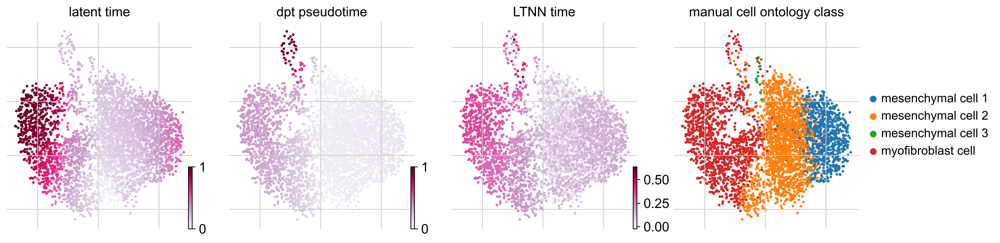

In [54]:
scv.pl.scatter(scpancera.adata_test, color=['latent_time','dpt_pseudotime','LTNN_time','manual_cell_ontology_class'], 
               cmap='PuRd',legend_loc='right margin',save='_fig4_tsp1_time.png')

saving figure to file ./figures/scvelo__sfig4_tsp1_time.png


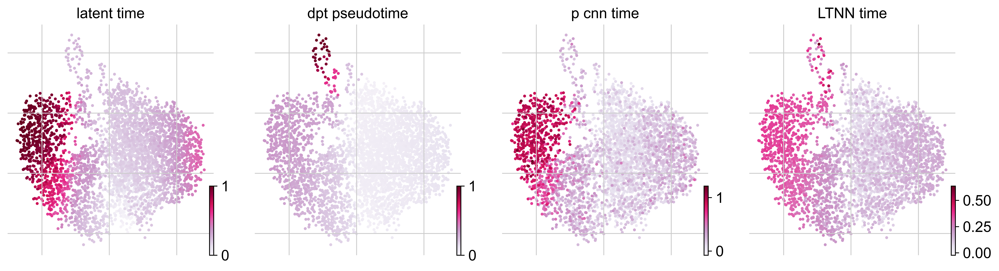

In [55]:
scv.pl.scatter(scpancera.adata_test, color=['latent_time','dpt_pseudotime','p_cnn_time','LTNN_time'], 
               cmap='PuRd',legend_loc='right margin',save='_sfig4_tsp1_time.png')

In [95]:
import scLTNN
scpancera=scLTNN.scLTNN(adata1)
scpancera.load_model('my_model1.h5')
#scpancera.cal_high_variable_genes()
scpancera.cal_lsi(n_components=100)
scpancera.cal_paga(resolution=1.0)
scpancera.cal_model_time()
scpancera.cal_rps_value(species='human')
scpancera.cal_dpt_pseudotime(leiden_range=0.04)
scpancera.CNN(batch_size=30,epochs=100,verbose=0)
scpancera.cal_distrubute()
scpancera.cal_scLTNN_time(mode='Best_dweibull')

......calculate lsi
......calculate paga
......predict model_time
......calculate RPS value
......calculate dpt_pseudotime


2022-07-04 04:14:18.143482: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......leiden_start ['9', '2'] leiden_end ['0']
......CNN
Model: "scLTNN_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_36 (Dense)            (None, 512)               51712     
                                                                 
 dense_37 (Dense)            (None, 512)               262656    
                                                                 
 dense_38 (Dense)            (None, 512)               262656    
                                                                 
 dense_39 (Dense)            (None, 1)                 513       
                                                                 
Total params: 577,537
Trainable params: 577,537
Non-trainable params: 0
_________________________________________________________________
None


2022-07-04 04:14:19.110556: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-04 04:14:19.472417: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......CNN:loss 0.011268537491559982 MAE 0.0815134271979332
......predicted CNN Time
......Dweibull analysis
[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 160.596] [loc=0.224 scale=0.194]
[distfit] >[expon     ] [0.00 sec] [RSS: 121.188] [loc=0.000 scale=0.224]
[distfit] >[pareto    ] [0.04 sec] [RSS: 121.18] [loc=-3830275.487 scale=3830275.487]


2022-07-04 04:14:40.965256: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


[distfit] >[dweibull  ] [0.01 sec] [RSS: 115.407] [loc=0.235 scale=0.197]
[distfit] >[t         ] [0.03 sec] [RSS: 161.269] [loc=0.222 scale=0.191]
[distfit] >[genextreme] [0.05 sec] [RSS: 89.6529] [loc=0.084 scale=0.083]
[distfit] >[gamma     ] [0.01 sec] [RSS: 121.454] [loc=-0.000 scale=0.196]
[distfit] >[lognorm   ] [0.02 sec] [RSS: 101.57] [loc=-0.001 scale=0.138]
[distfit] >[beta      ] [0.05 sec] [RSS: 123.716] [loc=-0.000 scale=1.333]
[distfit] >[uniform   ] [9.67 sec] [RSS: 179.462] [loc=0.000 scale=1.000]
[distfit] >[loggamma  ] [0.03 sec] [RSS: 159.673] [loc=-67.008 scale=8.848]
[distfit] >Compute confidence interval [parametric]
......Norm analysis
[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 14.7541] [loc=0.536 scale=0.297]
[distfit] >[expon     ] [9.91 sec] [RSS: 22.3591] [loc=-0.006 scale=0.542]
[distfit] >[pareto    ] [0.04 sec] [RSS: 23.4746] [loc=-11421657.837 scale=11421657.831]
[distfit] >[dweibull  ] [0.01 sec] [RSS: 16.7636] [loc

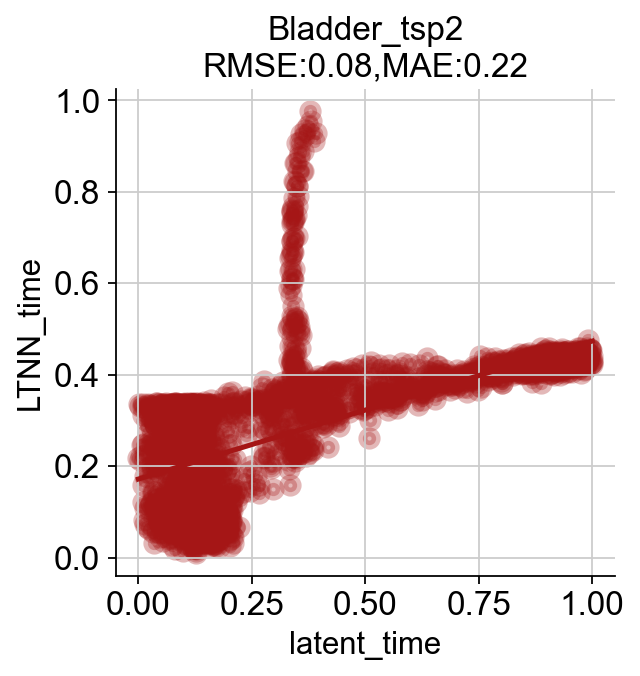

In [96]:

from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

sns.regplot(x=scpancera.adata_test.obs['latent_time'], y=scpancera.adata_test.obs['LTNN_time'],
    scatter_kws={'alpha':0.3,'linewidths':4},color='#a51616',ax=ax)

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

mae=round(mean_absolute_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['LTNN_time']),2)
mse=round(mean_squared_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['LTNN_time']),2)
#r2_score=round(r2_score(Y_val, PredValSet.T[0]),2)

plt.title('Bladder_tsp2\nRMSE:{},MAE:{}'.format(mse,mae),fontsize=15)
plt.savefig("figure/Fig4_tsp2_ltnn_latent.png",dpi=300,bbox_inches = 'tight')

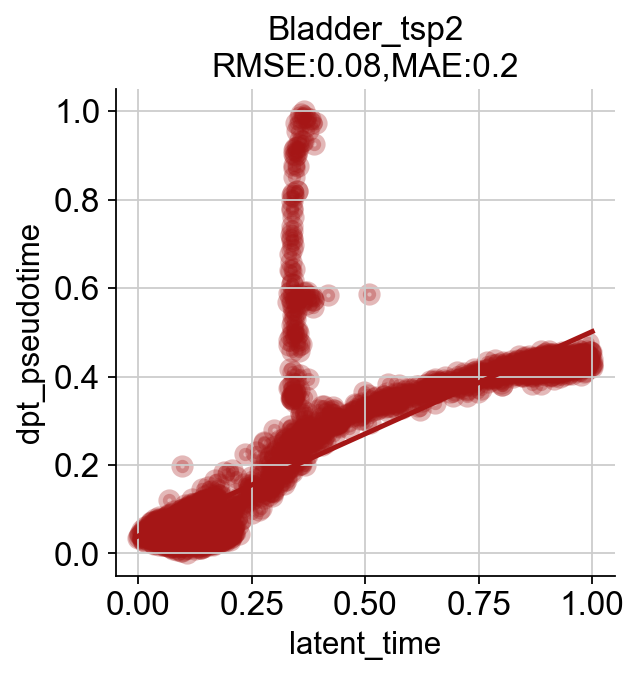

In [97]:

from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

sns.regplot(x=scpancera.adata_test.obs['latent_time'], y=scpancera.adata_test.obs['dpt_pseudotime'],
    scatter_kws={'alpha':0.3,'linewidths':4},color='#a51616',ax=ax)

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

mae=round(mean_absolute_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['dpt_pseudotime']),2)
mse=round(mean_squared_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['dpt_pseudotime']),2)
#r2_score=round(r2_score(Y_val, PredValSet.T[0]),2)

plt.title('Bladder_tsp2\nRMSE:{},MAE:{}'.format(mse,mae),fontsize=15)
plt.savefig("figure/Fig4_tsp2_dpt_latent.png",dpi=300,bbox_inches = 'tight')

saving figure to file ./figures/scvelo__fig4_tsp2_time.png


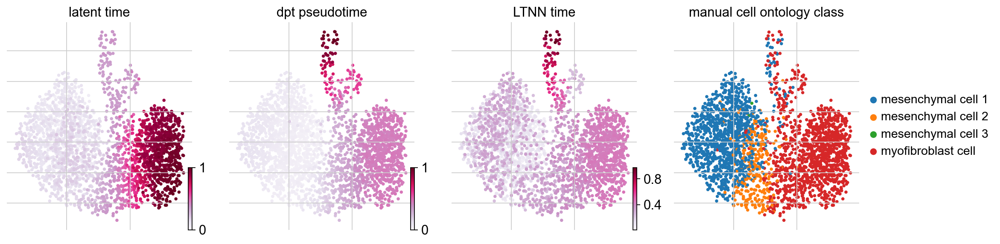

In [98]:
scv.pl.scatter(scpancera.adata_test, color=['latent_time','dpt_pseudotime','LTNN_time','manual_cell_ontology_class'], 
               cmap='PuRd',legend_loc='right margin',save='_fig4_tsp2_time.png')

In [115]:
scpancera.adata_test.obs['leiden']

AAACATACACCCAA    0
AAACATACCCCTCA    4
AAACATACCGGAGA    2
AAACATACTAACCG    2
AAACATACTCTTCA    1
                 ..
TTTGCATGAGCCTA    1
TTTGCATGCTAGCA    3
TTTGCATGCTGCAA    0
TTTGCATGGCTCCT    4
TTTGCATGTGGTAC    3
Name: leiden, Length: 65877, dtype: category
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']

In [116]:
leiden_pd=pd.DataFrame(columns=['Time_value'])
for i in set(scpancera.adata_test.obs['leiden']):
    leiden_pd.loc[i]={'Time_value':scpancera.adata_test.obs.loc[scpancera.adata_test.obs['leiden']==i,'p_latent_time'].mean()}
leiden_pd=leiden_pd.sort_values('Time_value')
leiden_start=leiden_pd.index[0]
leiden_end=leiden_pd.index[-1]
leiden_pd

,Time_value
5,0.178374
6,0.252647
1,0.276606
4,0.279023
3,0.279127
2,0.283122
0,0.638184


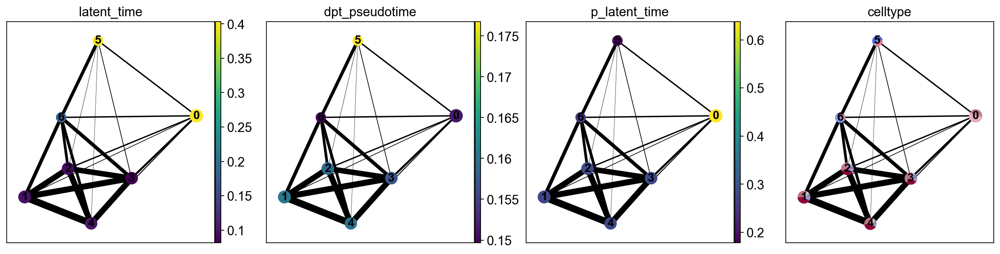

In [119]:
sc.pl.paga(scpancera.adata_test,color=['latent_time','dpt_pseudotime','p_latent_time','celltype'])

In [40]:
adata2

AnnData object with n_obs × n_vars = 3965 × 2000
    obs: 'X10X_run', 'smartseq2_barcode', 'smartseq2_library_plate', 'smartseq2_sorting_direction', 'smartseq2_sort_order', 'smartseq2_cDNA_Plate', 'method', 'donor', 'X10X_replicate', 'sequencer', 'sex', 'tissue', 'smartseq2_well_seq', 'notes', 'smartseq2_sorted_population', 'X10X_sample', 'anatomical_position', 'X10X_barcode', 'n_counts', 'n_genes', 'manual_cell_ontology_class', 'manual_annotation', 'doublet_filter', 'compartment', 'batch', 'compartment_pred', 'leiden', 'cluster_id', 'Propagated.Annotation', 'Entropy.All.Methods', 'Entropy.kNN.Reps', 'Entropy.scANVI.Reps', 'Entropy.SVM.Reps', 'Potential.Doublets', 'Onclass', 'singlecellNet', 'kNN', 'SVM', 'scANVI', 'compartment_pred_svm', 'manual_cell_ontology_classcollapsed', 'Propagated.Annotationcollapsed', 'Onclasscollapsed', 'singlecellNetcollapsed', 'kNNcollapsed', 'SVMcollapsed', 'scANVIcollapsed', 'miscompartmentalized', 'log_n_counts', 'log_n_genes', 'donor_method', 'decontX_c

# Pbmc68k

In [44]:
ran=np.random.choice(adata7.obs.index.tolist(),20000)

In [2]:
import scLTNN
import anndata
adata7=anndata.read_h5ad('pbmc68k_latent.h5ad')
#adata7=adata7[ran]
scpancera=scLTNN.scLTNN(adata7)
scpancera.load_model('my_model1.h5')
#scpancera.cal_high_variable_genes()
scpancera.cal_lsi(n_components=100)
scpancera.cal_paga(resolution=1.0)
scpancera.cal_model_time()
scpancera.cal_rps_value(species='human')
scpancera.cal_dpt_pseudotime(leiden_range=0.1,rev=True)


Metal device set to: Apple M1 Pro


2022-07-04 05:11:16.338212: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-07-04 05:11:16.338354: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


......calculate lsi
......calculate paga
......predict model_time


2022-07-04 05:12:00.673155: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-07-04 05:12:00.702702: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......calculate RPS value
......calculate dpt_pseudotime
......leiden_start ['5', '6', '1'] leiden_end ['0']


In [7]:
scpancera.adata_test.obs[['latent_time','dpt_pseudotime','dpt_pseudotime_p','dpt_pseudotime_r','p_latent_time','celltype']]

,latent_time,dpt_pseudotime,dpt_pseudotime_p,dpt_pseudotime_r,p_latent_time,celltype
AAACATACACCCAA,0.093744,0.512847,0.025693,1.000000,0.658221,CD8+ Cytotoxic T
AAACATACCCCTCA,0.096021,0.490359,0.006340,0.974378,0.144521,CD8+/CD45RA+ Naive Cytotoxic
AAACATACCGGAGA,0.035924,0.499744,0.017793,0.981695,0.186708,CD4+/CD45RO+ Memory
AAACATACTAACCG,0.080417,0.489586,0.007795,0.971376,0.299765,CD19+ B
AAACATACTCTTCA,0.063206,0.487122,0.000000,0.974245,0.379661,CD4+/CD25 T Reg
...,...,...,...,...,...,...
TTTGCATGAGCCTA,0.125873,0.488425,0.007919,0.968931,0.331437,CD8+ Cytotoxic T
TTTGCATGCTAGCA,0.075660,0.499740,0.013411,0.986069,0.217798,CD8+/CD45RA+ Naive Cytotoxic
TTTGCATGCTGCAA,0.179374,0.512396,0.039305,0.985488,0.580546,CD8+ Cytotoxic T
TTTGCATGGCTCCT,0.047990,0.500855,0.015854,0.985856,0.367375,CD8+ Cytotoxic T


In [43]:
np.flatnonzero(scpancera.adata_test.obs['leiden']=='0')

array([    0,     9,    14, ..., 65859, 65862, 65874])

In [41]:
scpancera.adata_test.uns['iroot'] = np.flatnonzero(scpancera.adata_test.obs['leiden']=='0')[0]
sc.tl.diffmap(scpancera.adata_test)
sc.tl.dpt(scpancera.adata_test)

In [29]:
np.flatnonzero(scpancera.adata_test.obs['leiden'].isin(['4']))[0]

1

In [38]:
del scpancera.adata_test.obs['dpt_pseudotime']

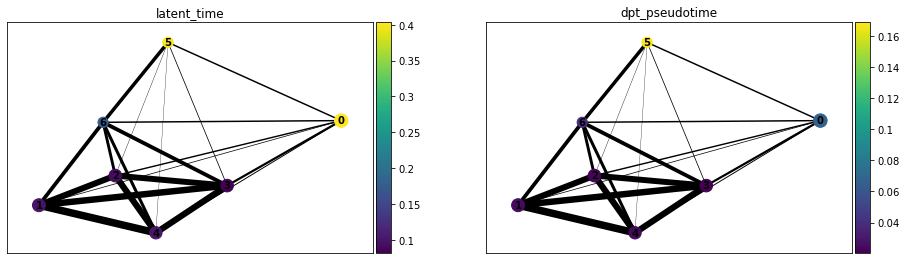

In [42]:
sc.pl.paga(scpancera.adata_test,color=['latent_time','dpt_pseudotime'])

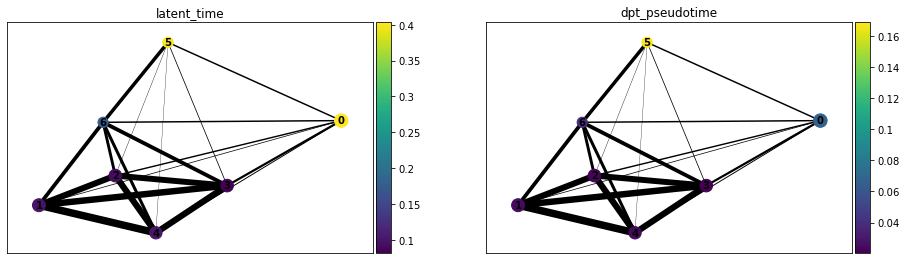

In [20]:
sc.pl.paga(scpancera.adata_test,color=['latent_time','dpt_pseudotime'])

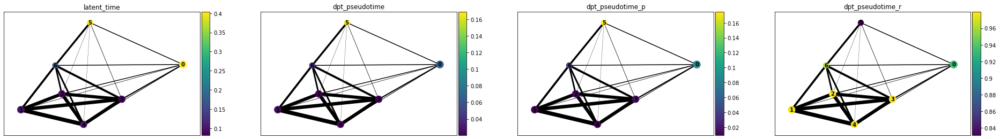

In [17]:
import scanpy as sc
sc.pl.paga(scpancera.adata_test,color=['latent_time','dpt_pseudotime','dpt_pseudotime_p','dpt_pseudotime_r'])

In [13]:
import numpy as np
np.max(scpancera.adata_test.obs['dpt_pseudotime_p'].values)-scpancera.adata_test.obs['dpt_pseudotime_r']

AAACATACACCCAA    0.000000
AAACATACCCCTCA    0.025622
AAACATACCGGAGA    0.018305
AAACATACTAACCG    0.028624
AAACATACTCTTCA    0.025755
                    ...   
TTTGCATGAGCCTA    0.031069
TTTGCATGCTAGCA    0.013931
TTTGCATGCTGCAA    0.014512
TTTGCATGGCTCCT    0.014144
TTTGCATGTGGTAC    0.027088
Name: dpt_pseudotime_r, Length: 65877, dtype: float32

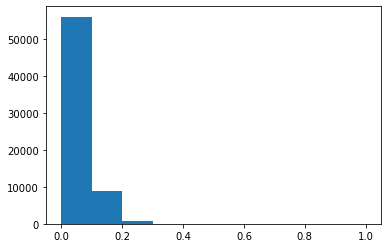

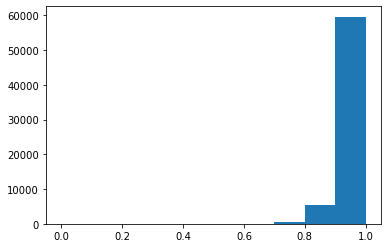

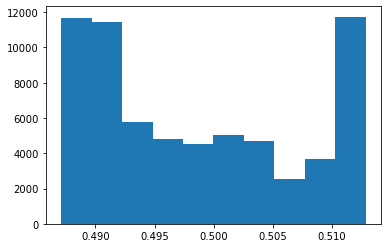

In [9]:
import matplotlib.pyplot as plt
plt.hist(scpancera.adata_test.obs['dpt_pseudotime_p'])
plt.show()
plt.hist(scpancera.adata_test.obs['dpt_pseudotime_r'])
plt.show()
plt.hist(scpancera.adata_test.obs['dpt_pseudotime'])
plt.show()

saving figure to file ./figures/scvelo__fig4_pbmc_time.png


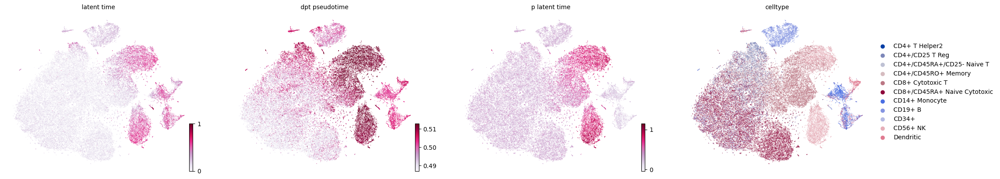

In [4]:
import scvelo as scv
scv.pl.scatter(scpancera.adata_test, color=['latent_time','dpt_pseudotime','p_latent_time','celltype'], 
               cmap='PuRd',legend_loc='right margin',save='_fig4_pbmc_time.png')

In [12]:
a2['p_latent_time'].mean()

0.63818425

In [21]:
plot_pd=pd.DataFrame()
plot_pd['cell_id']=scpancera.adata_test.obs.index
plot_pd['leiden']=scpancera.adata_test.obs.loc[plot_pd['cell_id'],'leiden'].values
plot_pd['dpt_time']=scpancera.adata_test.obs['dpt_pseudotime'].values
plot_pd['p_latent_time']=scpancera.adata_test.obs['p_latent_time'].values
a1=plot_pd.loc[plot_pd['leiden'].isin(scpancera.leiden_start)].copy()
#a1['p_time']=np.random.normal(0.07, 0.03, len(a1))
a2=plot_pd.loc[plot_pd['leiden'].isin(scpancera.leiden_end)].copy()
#a2['p_time']=np.random.normal(0.93, 0.03, len(a2))

a1['p_time']=np.random.normal(a1['p_latent_time'].mean(), a1['p_latent_time'].std(), len(a1))
a2['p_time']=np.random.normal(a2['p_latent_time'].mean(), a2['p_latent_time'].std(), len(a2))

train_pd=pd.concat([a1,a2])
train_pd.index=train_pd['cell_id']
train_pd

,cell_id,leiden,dpt_time,p_latent_time,p_time
cell_id,,,,,
AAACATACTCTTCA,AAACATACTCTTCA,1,0.487122,0.379661,0.325217
AAACATACTGGATC,AAACATACTGGATC,1,0.492983,0.257768,0.079383
AAACATTGGGGTGA,AAACATTGGGGTGA,1,0.492023,0.390974,0.233915
AAACCGTGACAGTC,AAACCGTGACAGTC,1,0.494114,0.423269,0.168033
AAACCGTGTCACCC,AAACCGTGTCACCC,1,0.498693,0.541471,0.164444
...,...,...,...,...,...
TTTCGAACACGACT,TTTCGAACACGACT,0,0.512245,0.526671,0.464337
TTTCGAACTACTGG,TTTCGAACTACTGG,0,0.511017,0.669834,0.829251
TTTCTACTGGGACA,TTTCTACTGGGACA,0,0.512583,0.555204,0.324517


In [38]:
scpancera.adata_test[ran].obsm['X_lsi']

ArrayView([[ 0.9691645747, -0.0216389754, -0.4402250969, ...,
            -0.228802283 ,  0.1762692402, -1.2625250006],
           [ 1.0581871772, -0.5428443107,  0.2955297215, ...,
             1.3130033223,  0.3071544753,  1.5448843614],
           [ 0.9014649792,  0.0655124064,  2.1568784021, ...,
             0.3163017442,  1.7392970725, -0.7345422971],
           ...,
           [ 0.9579989944,  1.5958423396, -0.1151958431, ...,
            -1.0524347705,  0.7688987096,  1.364921313 ],
           [ 1.1302975864, -0.2466722014,  3.1304892208, ...,
            -0.641732304 ,  0.3492388145,  0.5939605089],
           [ 0.7716282722,  2.9169730373, -0.5485290813, ...,
             1.1212981929,  0.2426591974, -0.6560765413]])

In [23]:
ran=np.random.choice(train_pd.index.tolist(),8*(len(train_pd)//10))
ran_r=list(set(train_pd.index.tolist())-set(ran))

X_train=scpancera.adata_test[ran].obsm['X_lsi']
#Y_train=adata_test.obs.loc[ran,'p_latent_time']
Y_train=train_pd.loc[ran,'dpt_time']
X_test=scpancera.adata_test[ran_r].obsm['X_lsi']
#Y_test=adata_test.obs.loc[ran_r,'p_latent_time']
Y_test=train_pd.loc[ran_r,'dpt_time']

model_cnn=scpancera.creat_radio_model(scpancera.n_components)
history1=model_cnn.fit(X_train, Y_train.values,
          batch_size=30,
          epochs=10,
          verbose=1,
          validation_data=(X_test, Y_test.values),)
score1 = model_cnn.evaluate(X_test, Y_test.values, verbose=0)
print('......CNN:loss',score1[0],'MAE',score1[1])
print('......predicted CNN Time')


Model: "scLTNN_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 512)               51712     
                                                                 
 dense_13 (Dense)            (None, 512)               262656    
                                                                 
 dense_14 (Dense)            (None, 512)               262656    
                                                                 
 dense_15 (Dense)            (None, 1)                 513       
                                                                 
Total params: 577,537
Trainable params: 577,537
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/10
  9/931 [..............................] - ETA: 6s - loss: 0.6281 - mean_absolute_error: 0.6418  

2022-07-04 04:49:23.887735: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


931/931 [==============================] - ETA: 0s - loss: 0.0147 - mean_absolute_error: 0.0362

2022-07-04 04:49:29.667981: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


931/931 [==============================] - 7s 8ms/step - loss: 0.0147 - mean_absolute_error: 0.0362 - val_loss: 7.7068e-05 - val_mean_absolute_error: 0.0078
Epoch 2/10
931/931 [==============================] - 7s 7ms/step - loss: 7.8679e-05 - mean_absolute_error: 0.0079 - val_loss: 7.7487e-05 - val_mean_absolute_error: 0.0078
Epoch 3/10
931/931 [==============================] - 7s 8ms/step - loss: 7.9513e-05 - mean_absolute_error: 0.0079 - val_loss: 7.8420e-05 - val_mean_absolute_error: 0.0079
Epoch 4/10
931/931 [==============================] - 7s 8ms/step - loss: 8.0158e-05 - mean_absolute_error: 0.0079 - val_loss: 7.8793e-05 - val_mean_absolute_error: 0.0078
Epoch 5/10
931/931 [==============================] - 7s 8ms/step - loss: 8.2010e-05 - mean_absolute_error: 0.0080 - val_loss: 7.7430e-05 - val_mean_absolute_error: 0.0078
Epoch 6/10
931/931 [==============================] - 7s 7ms/step - loss: 8.4487e-05 - mean_absolute_error: 0.0081 - val_loss: 8.6188e-05 - val_mean_absolu

In [24]:
X_val=scpancera.adata_test.obsm['X_lsi']
PredValSet=model_cnn.predict(X_val)


2022-07-04 04:51:20.478375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


In [28]:
model_cnn.evaluate(X_test, Y_test.values, verbose=0)

[7.767420902382582e-05, 0.007882855832576752]

In [36]:
model_cnn.evaluate(X_val, scpancera.adata_test.obs['dpt_pseudotime'].values, verbose=0)

[7.861180347390473e-05, 0.00796697847545147]

In [37]:
model_cnn.predict(X_val).T[0]

array([0.50131714, 0.50131714, 0.50131714, ..., 0.50131714, 0.50131714,
       0.50131714], dtype=float32)

(array([    0.,     0.,     0.,     0.,     0., 15691.,     0.,     0.,
            0.,     0.]),
 array([0.0013171434, 0.101317145 , 0.20131715  , 0.30131716  ,
        0.40131715  , 0.50131714  , 0.60131717  , 0.70131713  ,
        0.80131716  , 0.9013171   , 1.0013171   ], dtype=float32),
 <BarContainer object of 10 artists>)

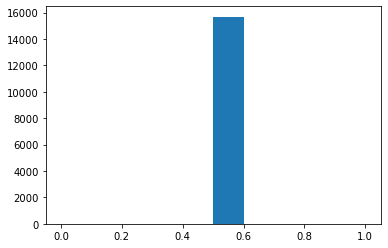

In [32]:
plt.hist(model_cnn.predict(X_test).T[0])

<AxesSubplot:xlabel='latent_time'>

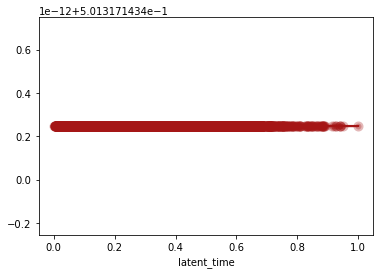

In [25]:
sns.regplot(x=scpancera.adata_test.obs['latent_time'], y=PredValSet.T[0],
    scatter_kws={'alpha':0.3,'linewidths':4},color='#a51616')

In [6]:
scpancera.CNN(batch_size=30,epochs=50,verbose=0)
scpancera.cal_distrubute()
scpancera.cal_scLTNN_time()

......CNN
Model: "scLTNN_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               51712     
                                                                 
 dense_1 (Dense)             (None, 512)               262656    
                                                                 
 dense_2 (Dense)             (None, 512)               262656    
                                                                 
 dense_3 (Dense)             (None, 1)                 513       
                                                                 
Total params: 577,537
Trainable params: 577,537
Non-trainable params: 0
_________________________________________________________________
None


2022-07-04 04:34:53.751824: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-04 04:34:58.873717: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......CNN:loss 0.17795369029045105 MAE 0.4122464060783386
......predicted CNN Time


2022-07-04 04:40:04.201904: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


......Dweibull analysis
[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 62605.2] [loc=0.499 scale=0.008]
[distfit] >[expon     ] [0.00 sec] [RSS: 46826.9] [loc=0.487 scale=0.012]
[distfit] >[pareto    ] [0.33 sec] [RSS: 49144.1] [loc=0.445 scale=0.042]
[distfit] >[dweibull  ] [0.30 sec] [RSS: 58403.8] [loc=0.500 scale=0.009]
[distfit] >[t         ] [0.35 sec] [RSS: 62605] [loc=0.499 scale=0.008]
[distfit] >[genextreme] [0.72 sec] [RSS: 51305.2] [loc=0.494 scale=0.006]
[distfit] >[gamma     ] [0.28 sec] [RSS: 44404.7] [loc=0.487 scale=0.008]
[distfit] >[lognorm   ] [0.67 sec] [RSS: 41893.8] [loc=0.487 scale=0.008]
[distfit] >[beta      ] [1.08 sec] [RSS: 57505.9] [loc=0.487 scale=0.026]
[distfit] >[uniform   ] [0.00 sec] [RSS: 44078.4] [loc=0.487 scale=0.026]
[distfit] >[loggamma  ] [0.33 sec] [RSS: 62213.8] [loc=-1.650 scale=0.302]
[distfit] >Compute confidence interval [parametric]
......Norm analysis
[distfit] >fit..
[distfit] >transform..
[distfit] >

saving figure to file ./figures/scvelo__fig4_pbmc_time.png


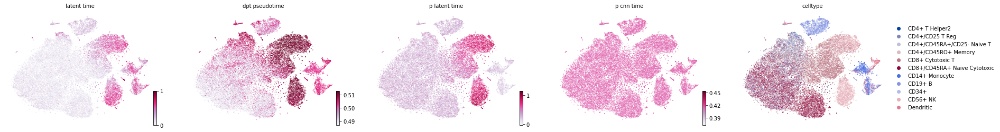

In [8]:
scv.pl.scatter(scpancera.adata_test, color=['latent_time','dpt_pseudotime','p_latent_time','p_cnn_time','celltype'], 
               cmap='PuRd',legend_loc='right margin',save='_fig4_pbmc_time.png')

ValueError: Input contains NaN.

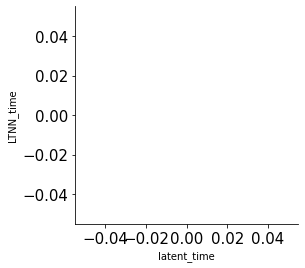

In [7]:

from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

sns.regplot(x=scpancera.adata_test.obs['latent_time'], y=scpancera.adata_test.obs['LTNN_time'],
    scatter_kws={'alpha':0.3,'linewidths':4},color='#a51616',ax=ax)

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

mae=round(mean_absolute_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['LTNN_time']),2)
mse=round(mean_squared_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['LTNN_time']),2)
#r2_score=round(r2_score(Y_val, PredValSet.T[0]),2)

plt.title('Pbmc68k\nRMSE:{},MAE:{}'.format(mse,mae),fontsize=15)
plt.savefig("figure/Fig4_pbmc_ltnn_latent.png",dpi=300,bbox_inches = 'tight')

In [ ]:

from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
#定义图片大小
pp=plt.figure(figsize=(4,4))
#用ax控制图片
ax=pp.add_subplot(1,1,1)

sns.regplot(x=scpancera.adata_test.obs['latent_time'], y=scpancera.adata_test.obs['dpt_pseudotime_p'],
    scatter_kws={'alpha':0.3,'linewidths':4},color='#a51616',ax=ax)

#设置横纵坐标轴字体
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)

#不显示右边跟上边
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

mae=round(mean_absolute_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['dpt_pseudotime']),2)
mse=round(mean_squared_error(scpancera.adata_test.obs['latent_time'], scpancera.adata_test.obs['dpt_pseudotime']),2)
#r2_score=round(r2_score(Y_val, PredValSet.T[0]),2)

plt.title('Pbmc68k\nRMSE:{},MAE:{}'.format(mse,mae),fontsize=15)
plt.savefig("figure/Fig4_pbmc_dpt_latent.png",dpi=300,bbox_inches = 'tight')

saving figure to file ./figures/scvelo__fig4_pbmc_time.png


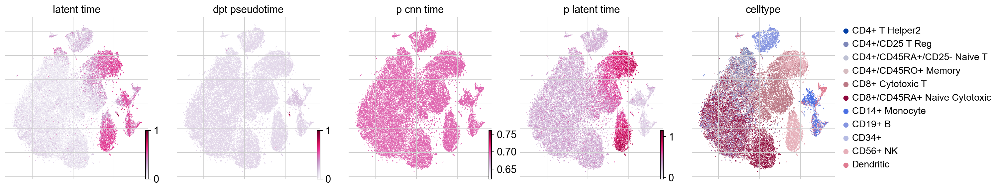

In [114]:
scv.pl.scatter(scpancera.adata_test, color=['latent_time','dpt_pseudotime','p_cnn_time','p_latent_time','celltype'], 
               cmap='PuRd',legend_loc='right margin',save='_fig4_pbmc_time.png')